# Imports and setup

In [1]:
import astropy.table as at
import astropy.units as u
import matplotlib as mpl
import matplotlib.pyplot as plt
import cmasher as cmr

%matplotlib inline
import numpy as np
import gala.coordinates as gc

from jax.config import config

config.update("jax_enable_x64", True)
import jax
import jax.numpy as jnp
import jaxopt

import pickle

import arviz as az
import numpyro

from scipy.stats import binned_statistic
from scipy.interpolate import InterpolatedUnivariateSpline as IUS

numpyro.enable_x64()
numpyro.set_host_device_count(2)
#from numpyro_ext.optim import optimize

import sys
import importlib
sys.path.append('/Users/Tavangar/Work/stream-membership/')
sys.path.append('../../')
sys.path.append('/Users/Tavangar/Work/CATS_workshop/cats/')
from stream_membership import StreamMixtureModel
from stream_membership.plot import plot_data_projections
from gd1_helpers.membership.gd1_model import (
    Base,
    BackgroundModel,
    StreamDensModel,
    OffTrackModel,
)
from gd1_helpers.membership.initialize import *
from scripts.gd1_init import *

from cats.pawprint.pawprint import Pawprint, Footprint2D
from cats.CMD import Isochrone
from cats.inputs import stream_inputs as inputs
from cats.proper_motions import ProperMotionSelection, rough_pm_poly

In [2]:
cmap = plt.get_cmap('cmr.amber_r')
mpl.rc('image', cmap=cmap.name)
mpl.rc('image', cmap='gray_r')

In [3]:
data = at.Table.read("../../../CATS_Workshop/cats/data/joined-GD-1.fits")

#data = at.Table.read('../data/tmp/run_data.fits')
#masks = at.Table.read('../data/tmp/run_data_masks.fits')
cat = data
cat['pm1'] = cat['pm_phi1_cosphi2_unrefl']
cat['pm2'] = cat['pm_phi2_unrefl']


stream='GD-1'
phi1_lim = (np.min(cat['phi1']), np.max(cat['phi1']))
phi1_lim = [-100,20]

cat = cat[(cat['phi1'] < phi1_lim[1]) & (cat['phi1'] > phi1_lim[0])] # clunky to hard code this

In [4]:
p = Pawprint.pawprint_from_galstreams(inputs[stream]['short_name'],
                                      inputs[stream]['pawprint_id'],
                                      width=inputs[stream]['width'] * u.deg,
                                      phi1_lim=phi1_lim)

# rough pm cut to start with (this comes only from the galstreams proper motion tracks)
p.pmprint, pm_mask = rough_pm_poly(p, cat, buffer=2)

# Create the CMD cuts
o = Isochrone(stream, cat, pawprint=p)
_, iso_mask, _, hb_mask, pprint = o.simpleSln(maxmag=22, mass_thresh=0.83)

pmsel = ProperMotionSelection(stream, cat, pprint,
                              n_dispersion_phi1=3, n_dispersion_phi2=3, cutoff=0.1)

##### rough pm cut to start with (this comes only from the galstreams proper motion tracks)
p.pmprint, pm_mask = rough_pm_poly(p, cat, buffer=2)

Modifying/extrapolating galstreams track
Modifying/extrapolating galstreams track
-40.18182128833206
Fitting for peak pm location
Pre-fitting mean PM values: -13.031, -3.108
Post-fitting (pm1_mean, pm2_mean, pm1_std, pm2_std): [-13.2765824411502, -3.1631661457594973, 0.4018776191208751, 0.5346353001205577] 

Producing the polygon and mask


In [7]:
# with open('../data/gd1_pawprint.pkl', 'wb') as output_file:
#     pickle.dump(p, output_file)

In [5]:
# Base.setup(p, cat)

run_data_ = o.cat[pm_mask & (iso_mask | hb_mask)]
run_data = {k: np.array(run_data_[k], dtype="f8") for k in run_data_.colnames}

# with open('../data/gd1_run_data.pkl', 'wb') as output_file:
#     pickle.dump(run_data, output_file)

bkg_data_ = o.cat[pm_mask & (iso_mask | hb_mask) & ~o.on_skymask]
bkg_data = {k: np.array(bkg_data_[k], dtype="f8") for k in bkg_data_.colnames}

# with open('../data/gd1_bkg_data.pkl', 'wb') as output_file:
#     pickle.dump(bkg_data, output_file)

stream_data_ = o.cat[pmsel.pm12_mask & (iso_mask | hb_mask) & o.on_skymask]
stream_data = {k: np.array(stream_data_[k], dtype="f8") for k in stream_data_.colnames}

# with open('../data/gd1_stream_data.pkl', 'wb') as output_file:
#     pickle.dump(stream_data, output_file)

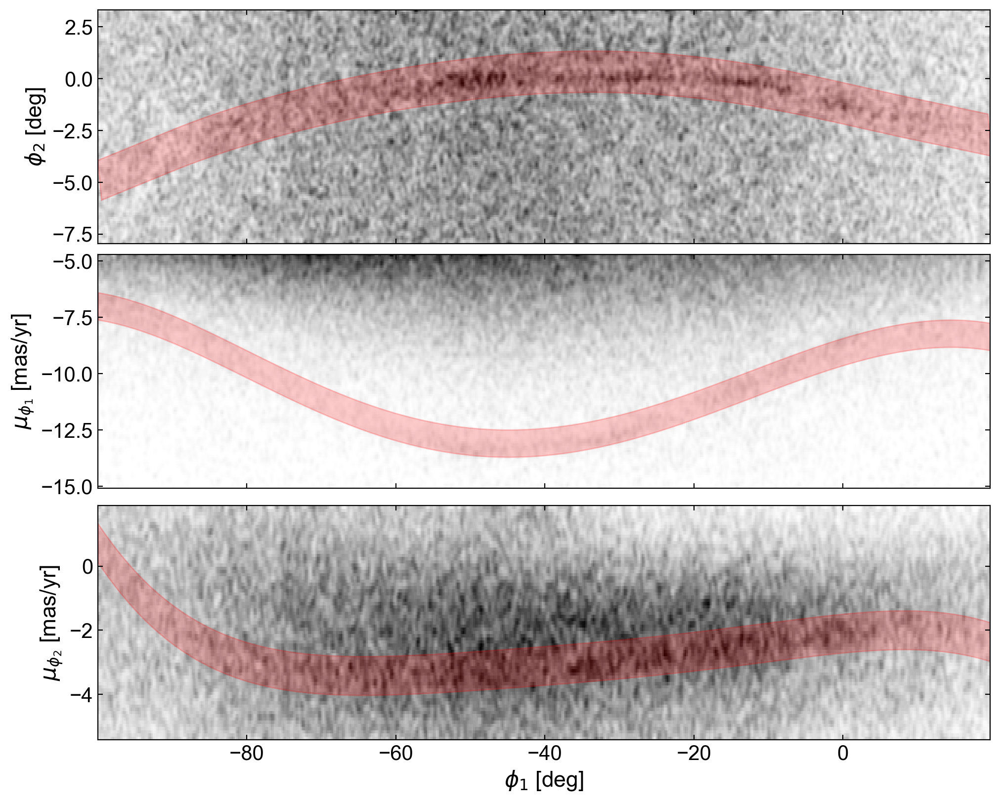

In [13]:
patch_sky = mpl.patches.Polygon(
            o.pawprint.skyprint["stream"].vertices[::50],
            facecolor="r",
            edgecolor="r",
            linewidth=1,
            alpha=0.2
        )

spline_phi2, spline_pm1, spline_pm2, _ = pmsel.from_galstreams()

fig, axes, _ = plot_data_projections(data=run_data, grids=Base.default_grids,
                      smooth=1, pcolormesh_kwargs={'rasterized':True});
axes[0].add_patch(patch_sky)
phi1_array = np.arange(-100, 20, 0.2)
axes[1].fill_between(phi1_array, spline_pm1(phi1_array)+np.exp(-0.5), spline_pm1(phi1_array)-np.exp(-0.5), 
                     color='r', alpha=0.2)
axes[2].fill_between(phi1_array, spline_pm2(phi1_array)+np.exp(-0.5), spline_pm2(phi1_array)-np.exp(-0.5), 
                     color='r', alpha=0.2)
# axes[1].add_patch(patch_pm1)
# axes[2].add_patch(patch_pm2)
plt.savefig('../paper_figures/gd1_data.pdf')
plt.show()

# Background

In [6]:
import importlib
importlib.reload(sys.modules['scripts.gd1_init'])

from scripts.gd1_init import *

In [7]:
BkgInit = Initialize(p, cat)
BkgInit.init_base()

In [8]:
BkgInit.setup_bkg(knot_sep=10, phi2_bkg=False)

In [9]:
BkgInit.variables

{'phi1': <stream_membership.variables.GridGMMVariable at 0x7fcb48256250>,
 'phi2': <stream_membership.variables.UniformVariable at 0x7fca7801c4c0>,
 'pm1': <stream_membership.variables.Normal1DSplineMixtureVariable at 0x7fcb58683190>,
 'pm2': <stream_membership.variables.Normal1DSplineMixtureVariable at 0x7fcb5865a0a0>}

In [10]:
bkg_init_p = {
    "ln_N": np.log(len(bkg_data['phi1'])),
    #"phi1": {'zs': np.array([-3.5, -2.5, -1.5, -0.5, 0.5, 1.5, 2.5, 3.5])+1},
    "phi1": {'zs': np.zeros(BkgInit.phi1_locs.shape[0]-1)},
    "phi2": {},
    "pm1": {
        "w": np.full_like(BkgInit.pm1_knots, 0.5),
        "mean1": np.full_like(BkgInit.pm1_knots, 0),
        "ln_std1": np.full_like(BkgInit.pm1_knots, 1),
        "mean2": np.full_like(BkgInit.pm1_knots, 5),
        "ln_std2": np.full_like(BkgInit.pm1_knots, 2)
    },
    "pm2": {
        "w": np.full_like(BkgInit.pm2_knots, 0.5),
        "mean1": np.full_like(BkgInit.pm2_knots, -2.),
        "ln_std1": np.full_like(BkgInit.pm2_knots, 1),
        "mean2": np.full_like(BkgInit.pm2_knots, -3),
        "ln_std2": np.full_like(BkgInit.pm2_knots, 2)
    },
}

# background_init = BackgroundModel(bkg_init_p)

In [11]:
background_init = BkgInit.init_params(bkg_init_p)

In [12]:
background_init

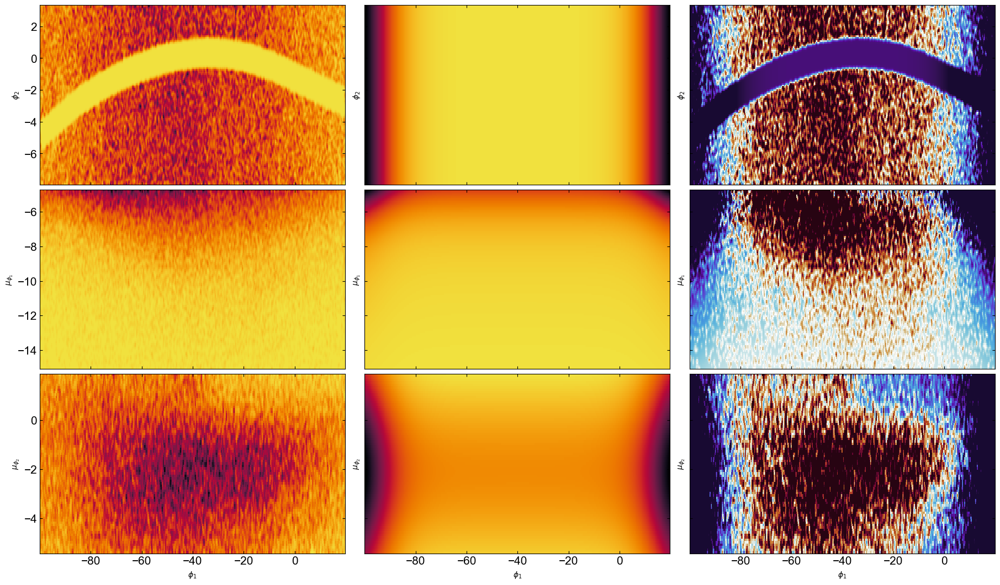

In [14]:
cmap = plt.get_cmap('cmr.ember_r')
mpl.rc('image', cmap=cmap.name)

fig, axes = plt.subplots(
    len(background_init.coord_names) - 1,
    3,
    figsize=(18, 3.5 * (len(background_init.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=bkg_data,
    grids=background_init.default_grids,
    axes=axes[:, 0],
    # coord_names=GD1BackgroundModel.coord_names,
)
background_init.plot_model_projections(axes=axes[:, 1])
background_init.plot_residual_projections(
    data=bkg_data, axes=axes[:, 2], pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap=cmr.fusion)
)

for ax in axes[-1]:
    ax.set_xlabel(r"$\phi_1$")

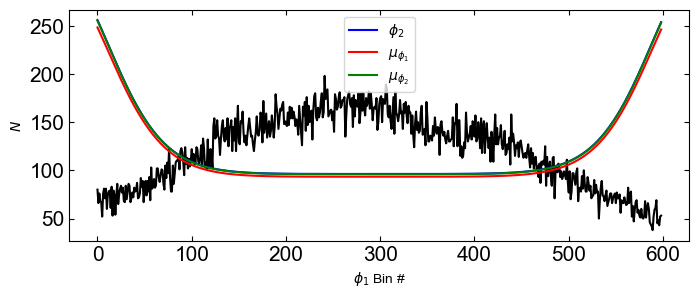

In [15]:
H_data1, *_ = np.histogram2d(
    bkg_data["phi1"],
    bkg_data["phi2"],
    bins=(background_init.default_grids["phi1"], background_init.default_grids['phi2'])
)

grids, ln_ns = background_init.evaluate_on_2d_grids()

fig, ax1 = plt.subplots(1,1,figsize=(8, 3))
ax1.plot(H_data1.sum(axis=1), c='k')
ax1.plot(np.exp(ln_ns[('phi1', 'phi2')]).sum(axis=0), c='b', label=r'$\phi_2$')
ax1.plot(np.exp(ln_ns[('phi1', 'pm1')]).sum(axis=0), c='r', label=r'$\mu_{\phi_1}$')
ax1.plot(np.exp(ln_ns[('phi1', 'pm2')]).sum(axis=0), c='g', label=r'$\mu_{\phi_2}$')
ax1.set_xlabel(r'$\phi_1$ Bin #')
ax1.set_ylabel(r'$N$')
ax1.legend()
plt.show()

In [18]:
def optimize(cls, data, init_params, jaxopt_kwargs=None, use_bounds=True, **kwargs):
    """
    A wrapper around numpyro_ext.optim utilities, which enable jaxopt optimization
    for numpyro models.
    """
    import jaxopt

    if jaxopt_kwargs is None:
        jaxopt_kwargs = {}
    jaxopt_kwargs.setdefault("maxiter", 1024)  # TODO: TOTALLY ARBITRARY

    optimize_kwargs = kwargs
    #jaxopt_kwargs.setdefault("method", "L-BFGS-B")
    optimize_kwargs["bounds"] = cls._get_jaxopt_bounds()
    optimize_kwargs["bounds"] = (
        cls._normalize_variable_keys(optimize_kwargs["bounds"][0]),
        cls._normalize_variable_keys(optimize_kwargs["bounds"][1]),
    )
    Optimizer = jaxopt.LBFGSB

    optimizer = Optimizer(**jaxopt_kwargs, fun=cls._objective)
    opt_res = optimizer.run(
        init_params=cls._normalize_variable_keys(init_params),
        data=cls._normalize_variable_keys(data),
        **optimize_kwargs,
    )
    return cls._expand_variable_keys(opt_res.params), opt_res.state

In [16]:
BkgInit.phi1_locs

Array([[-1.10000000e+02],
       [-9.99999997e+01],
       [-8.99999997e+01],
       [-7.99999997e+01],
       [-6.99999997e+01],
       [-5.99999997e+01],
       [-4.99999997e+01],
       [-3.99999997e+01],
       [-2.99999997e+01],
       [-1.99999997e+01],
       [-9.99999968e+00],
       [ 3.18221566e-07],
       [ 1.00000003e+01],
       [ 2.00000003e+01],
       [ 3.00000003e+01]], dtype=float64)

In [32]:
background_init.variables['pm2']._param_bounds

{'w': (Array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64, weak_type=True),
  Array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64, weak_type=True)),
 'mean1': (Array([-20, -20, -20, -20, -20, -20, -20, -20, -20, -20, -20, -20, -20],      dtype=int64, weak_type=True),
  Array([20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20],      dtype=int64, weak_type=True)),
 'ln_std1': (Array([-2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2],      dtype=int64, weak_type=True),
  Array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3], dtype=int64, weak_type=True)),
 'mean2': (Array([-20, -20, -20, -20, -20, -20, -20, -20, -20, -20, -20, -20, -20],      dtype=int64, weak_type=True),
  Array([20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20],      dtype=int64, weak_type=True)),
 'ln_std2': (Array([-2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2, -2],      dtype=int64, weak_type=True),
  Array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3], dtype=int64, weak_type=True))}

In [21]:
bkg_opt_pars, bkg_info = background_init.optimize(
    data=bkg_data,
    init_params=bkg_init_p,
    use_bounds=True,
    jaxopt_kwargs=dict(maxiter=4096),
)

# bkg_opt_pars, bkg_info = optimize(BackgroundModel,
#     data=bkg_data,
#     init_params=bkg_init_p,
#     use_bounds=True,
#     jaxopt_kwargs=dict(maxiter=4096),
# )


background_opt = BackgroundModel(bkg_opt_pars)
bkg_info

AttributeError: 'NoneType' object has no attribute '_param_bounds'

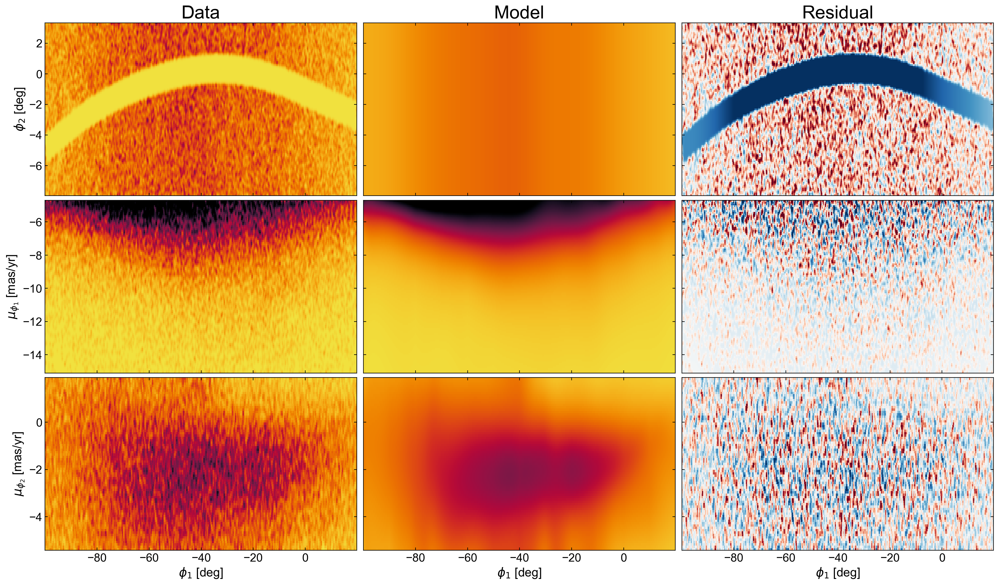

In [26]:
import importlib
importlib.reload(sys.modules['stream_membership.plot'])
importlib.reload(sys.modules['stream_membership.model'])

fig, axes = plt.subplots(
    len(background_opt.coord_names) - 1,
    3,
    figsize=(18, 3.5 * (len(background_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=bkg_data,
    grids=BackgroundModel.default_grids,
    axes=axes[:, 0],
    pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0)
    # coord_names=GD1BackgroundModel.coord_names,
)
background_opt.plot_model_projections(axes=axes[:, 1], label=False,
                                     pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0))
background_opt.plot_residual_projections(
    data=bkg_data, axes=axes[:, 2], label=False, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu', rasterized=True)
)
axes[0][0].set_title('Data', fontsize=24)
axes[0][1].set_title('Model', fontsize=24)
axes[0][2].set_title('Residual', fontsize=24)
plt.show()
fig.savefig('../paper_figures/background_model.pdf')

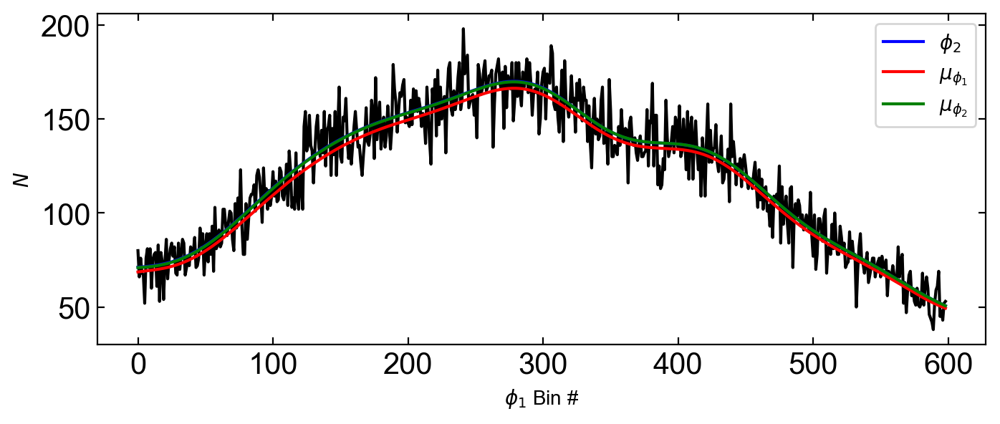

In [27]:
H_data1, *_ = np.histogram2d(
    bkg_data["phi1"],
    bkg_data["phi2"],
    bins=(background_opt.default_grids["phi1"], background_opt.default_grids['phi2'])
)

grids, ln_ns = background_opt.evaluate_on_2d_grids()

fig, ax1 = plt.subplots(1,1,figsize=(8, 3))
ax1.plot(H_data1.sum(axis=1), c='k')
ax1.plot(np.exp(ln_ns[('phi1', 'phi2')]).sum(axis=0), c='b', label=r'$\phi_2$')
ax1.plot(np.exp(ln_ns[('phi1', 'pm1')]).sum(axis=0), c='r', label=r'$\mu_{\phi_1}$')
ax1.plot(np.exp(ln_ns[('phi1', 'pm2')]).sum(axis=0), c='g', label=r'$\mu_{\phi_2}$')
ax1.set_xlabel(r'$\phi_1$ Bin #')
ax1.set_ylabel(r'$N$')
ax1.legend()
plt.show()

# Stream

In [28]:
StreamDensModel.stream_dens_update(pawprint=p, data=cat, knot_sep=10)

In [29]:
# TODO: replace this with galstreams initialization
from scipy.stats import binned_statistic
from scipy.interpolate import InterpolatedUnivariateSpline

#stream_mask = masks["sky_track"] & masks["pm_rough"]
stream_data_ = o.cat[pmsel.pm12_mask & (iso_mask | hb_mask) & o.on_skymask]
#stream_data = {k: v[stream_mask] for k, v in stream_data_.items()}
stream_data = {k: np.array(stream_data_[k], dtype="f8") for k in stream_data_.colnames}

_phi2_stat = binned_statistic(stream_data["phi1"], stream_data["phi2"], bins=np.linspace(phi1_lim[0], phi1_lim[1], 21))
_phi2_interp = IUS(
    0.5 * (_phi2_stat.bin_edges[:-1] + _phi2_stat.bin_edges[1:]), _phi2_stat.statistic, ext=0, k=1
)

_pm1_stat = binned_statistic(stream_data["phi1"], stream_data["pm1"], bins=np.linspace(phi1_lim[0], phi1_lim[1], 32))
_pm1_interp = IUS(
    0.5 * (_pm1_stat.bin_edges[:-1] + _pm1_stat.bin_edges[1:]), _pm1_stat.statistic, ext=0, k=1
)

_pm2_stat = binned_statistic(stream_data["phi1"], stream_data["pm2"], bins=np.linspace(phi1_lim[0], phi1_lim[1], 32))
_pm2_interp = IUS(
    0.5 * (_pm2_stat.bin_edges[:-1] + _pm2_stat.bin_edges[1:]), _pm2_stat.statistic, ext=0, k=1
)

In [30]:
# _pm1_interp=InterpolatedUnivariateSpline(p.track.track.transform_to(p.track.stream_frame).phi1,
#                                          p.track.track.transform_to(p.track.stream_frame).pm_phi1_cosphi2,
#                                          ext=3)
# _pm2_interp=InterpolatedUnivariateSpline(p.track.track.transform_to(p.track.stream_frame).phi1,
#                                          p.track.track.transform_to(p.track.stream_frame).pm_phi2,
#                                          ext=3)

In [31]:
stream_init_p = {
    "ln_N": np.log(len(stream_data['phi1'])),
    "phi1": {
        "zs": np.zeros(StreamDensModel.phi1_locs.shape[0]-1)
    },
    "phi2": {
        "mean": _phi2_interp(StreamDensModel.phi2_knots),
        "ln_std": np.full_like(StreamDensModel.phi2_knots, np.log(inputs[stream]['width']/2))
    },
    "pm1": {
        "mean": _pm1_interp(StreamDensModel.pm1_knots),
        "ln_std": np.full_like(StreamDensModel.pm1_knots, -0.5)
    },
    "pm2": {
        "mean": _pm2_interp(StreamDensModel.pm2_knots),
        "ln_std": np.full_like(StreamDensModel.pm2_knots, -0.5)
    }
}

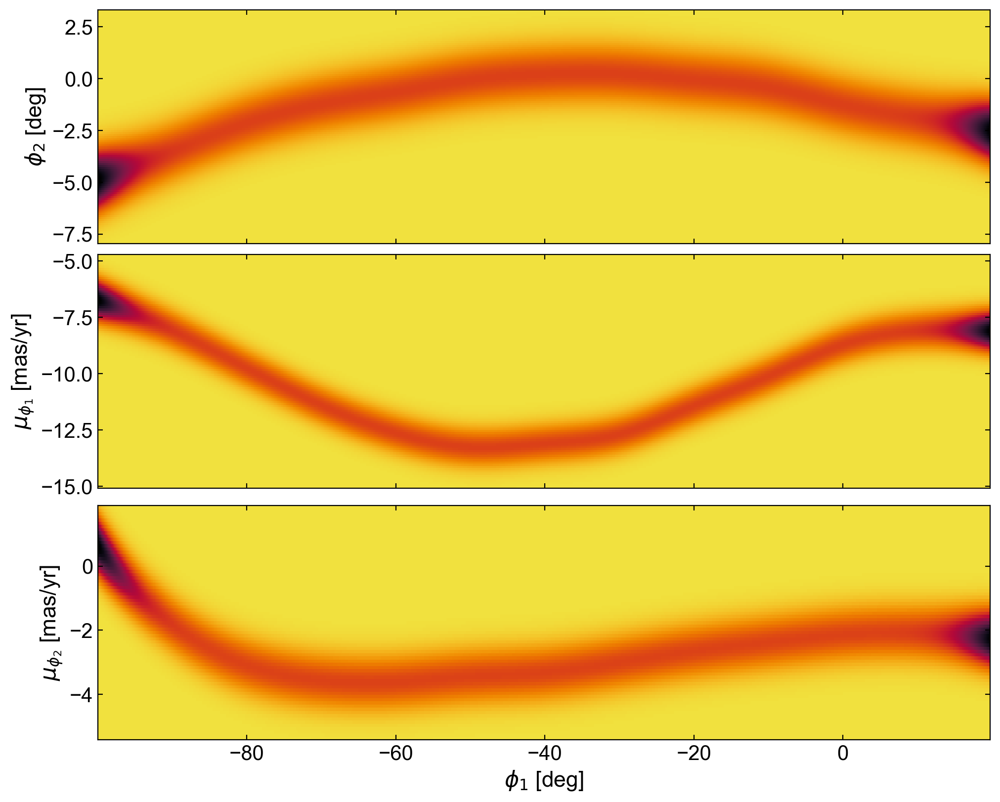

In [32]:
stream_init = StreamDensModel(stream_init_p)
_ = stream_init.plot_model_projections()

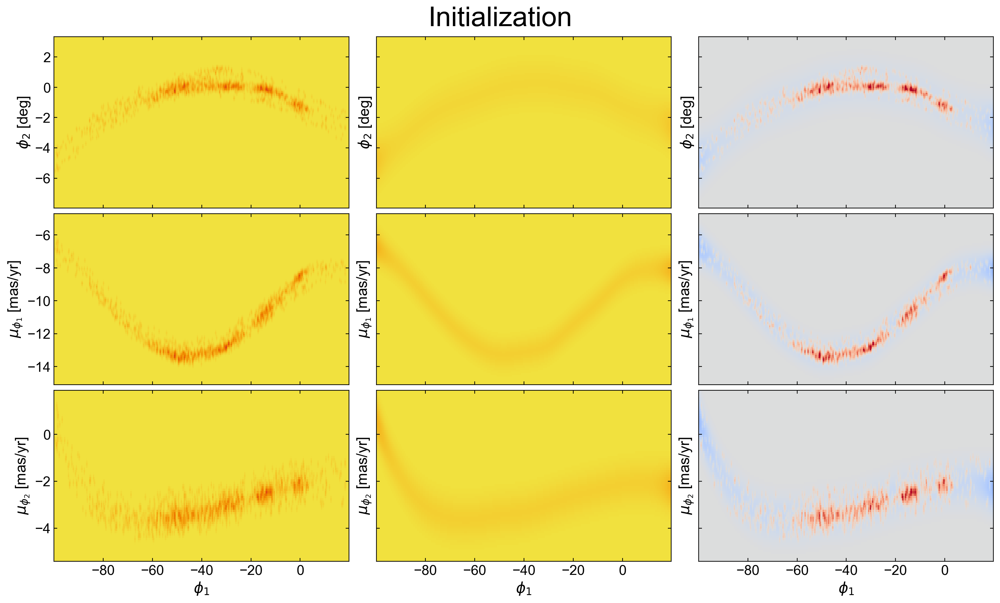

In [34]:
fig, axes = plt.subplots(
    len(stream_init.coord_names) - 1,
    3,
    figsize=(15, 3 * (len(stream_init.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=stream_data,
    grids=stream_init.default_grids,
    axes=axes[:, 0],
    pcolormesh_kwargs=dict(vmin=0, vmax=4)
    # coord_names=GD1BackgroundModel.coord_names,
)
stream_init.plot_model_projections(axes=axes[:, 1], pcolormesh_kwargs=dict(vmin=0, vmax=4))
stream_init.plot_residual_projections(
    data=stream_data, axes=axes[:, 2], pcolormesh_kwargs=dict(vmin=-1, vmax=1)
)

for ax in axes[-1]:
    ax.set_xlabel(r"$\phi_1$")
fig.suptitle('Initialization', fontsize=30)
plt.show()

In [35]:
stream_opt_pars, info = StreamDensModel.optimize(
    data=stream_data, init_params=stream_init_p, use_bounds=True
)

# stream_opt_pars, info = optimize(StreamDensModel,
#     data=stream_data, init_params=stream_init_p, use_bounds=True
# )

stream_opt = StreamDensModel(stream_opt_pars)
info

ScipyMinimizeInfo(fun_val=Array(-0.5935228, dtype=float64, weak_type=True), success=True, status=0, iter_num=701, hess_inv=LbfgsInvHessProduct(sk=[[ 1.92734717e-13 -2.60552188e-03  3.96373315e-04 ... -1.59337318e-06
  -2.50216331e-05  1.20618144e-04]
 [-6.07514039e-13 -3.18334758e-03  4.59140936e-04 ...  1.18579959e-06
  -2.44988802e-05  8.90819949e-05]
 [ 2.42472709e-13  3.20227250e-04 -6.08542292e-05 ... -1.07573962e-06
   3.06612086e-06 -4.97073916e-05]
 ...
 [-1.59872116e-14 -2.10932739e-03  1.98785218e-04 ... -1.77239212e-06
   3.30049778e-05 -2.32592982e-04]
 [-5.95079541e-14 -2.04181702e-03  2.17761031e-04 ... -2.62480478e-06
   2.70702058e-05 -1.90443567e-04]
 [-1.43884904e-13 -2.27486826e-03  2.59787561e-04 ... -1.74750529e-06
   1.76985688e-05 -1.90450141e-04]], yk=[[ 1.92734717e-13 -3.18757519e-07 -4.04538029e-07 ... -1.14267040e-06
  -2.03817739e-06  9.64708052e-07]
 [-6.07403017e-13 -4.12078683e-07 -5.80519349e-07 ...  1.71754994e-06
  -2.41001630e-06  6.40333889e-07]
 [ 2

Text(0, 0.5, '$\\phi_2$')

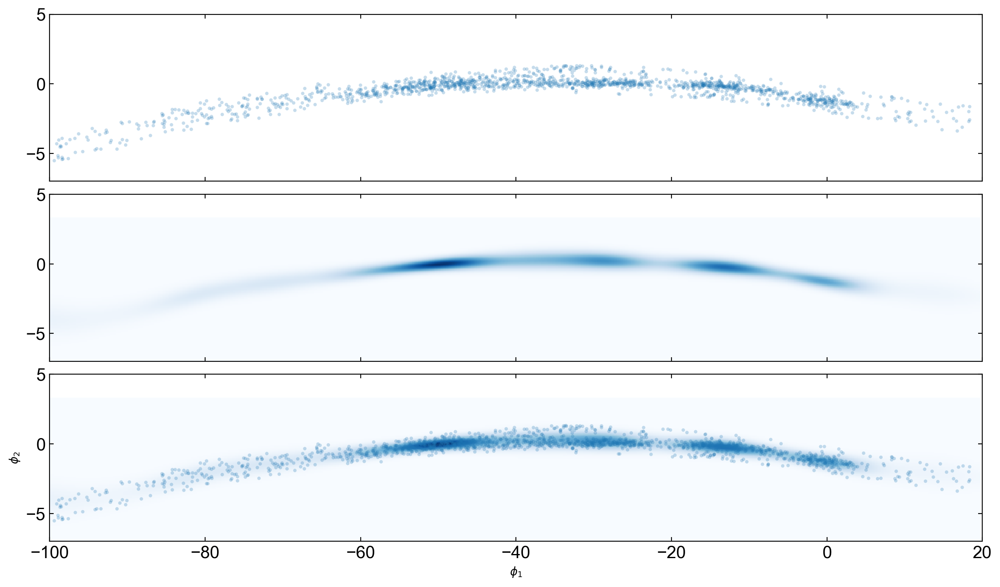

In [36]:
# _grids, ln_dens = GD1StreamModel(stream_init_p).evaluate_on_2d_grids()
_grids, ln_dens = stream_opt.evaluate_on_2d_grids()

fig, axes = plt.subplots(3, 1, figsize=(12, 7), constrained_layout=True, sharex=True, sharey=True)

for ax in [axes[0], axes[2]]:
    ax.plot(
        stream_data['phi1'],
        stream_data['phi2'],
        marker="o",
        markeredgewidth=0,
        markersize=3.0,
        ls="none",
        alpha=0.25,
    )
    
for ax in [axes[1], axes[2]]:
    ax.pcolormesh(
        _grids[('phi1', 'phi2')][0],
        _grids[('phi1', 'phi2')][1],
        np.exp(ln_dens[('phi1', 'phi2')]),
        cmap="Blues",
        shading='auto'
    )
ax.set_xlim(-100, 20)
ax.set_ylim(-7, 5)

ax.set_xlabel(r"$\phi_1$")
ax.set_ylabel(r"$\phi_2$")

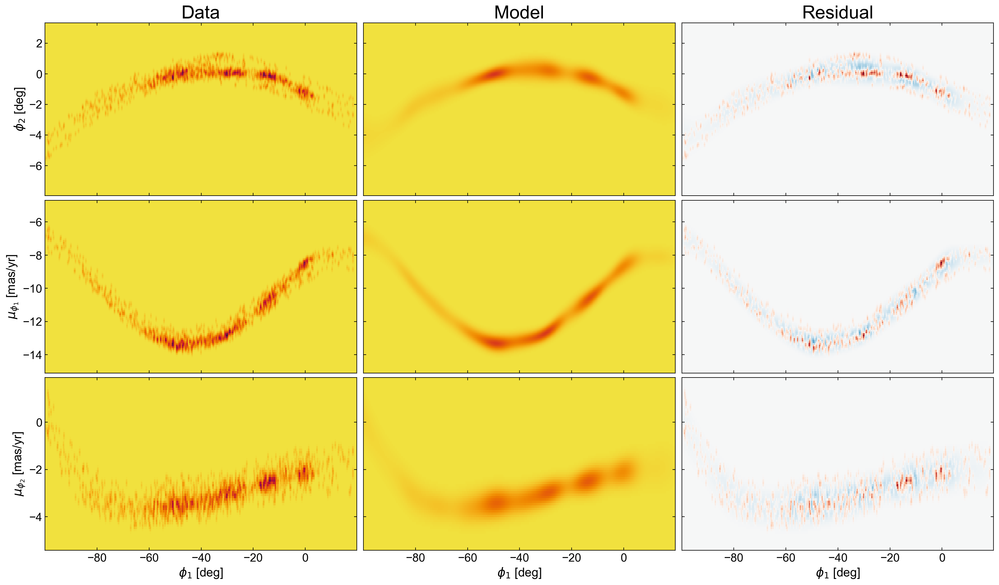

In [39]:
fig, axes = plt.subplots(
    len(background_opt.coord_names) - 1,
    3, 
    figsize=(18, 3.5 * (len(stream_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=stream_data,
    grids=Base.default_grids,
    axes=axes[:, 0],
    pcolormesh_kwargs=dict(rasterized=True, vmin=0, vmax=2)
)
stream_opt.plot_model_projections(axes=axes[:, 1], label=False, 
                                  pcolormesh_kwargs=dict(rasterized=True,vmin=0, vmax=2))
stream_opt.plot_residual_projections(
    data=stream_data, axes=axes[:, 2], label=False,
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu', rasterized=True)
)
axes[0][0].set_title('Data', fontsize=24)
axes[0][1].set_title('Model', fontsize=24)
axes[0][2].set_title('Residual', fontsize=24)
plt.show()
fig.savefig('../paper_figures/stream_model.pdf')

# Mixture of Stream + Background (no off-track)

In [40]:
Components = [StreamDensModel, BackgroundModel]
mix_params0 = {"stream": stream_opt_pars, "background": bkg_opt_pars}
mix_params0['background']['ln_N'] = np.log(len(run_data['phi1']) - np.exp(mix_params0['stream']['ln_N']))

In [41]:
mix_init = StreamMixtureModel(mix_params0, Components)

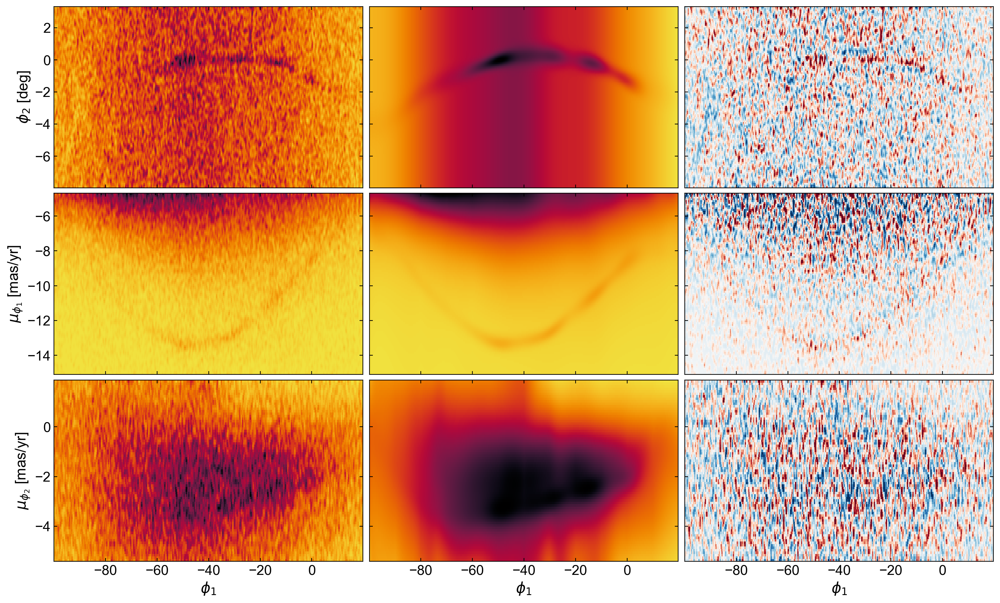

In [42]:
fig, axes = plt.subplots(
    len(stream_opt.coord_names) - 1,
    3, 
    figsize=(15, 3 * (len(stream_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=run_data,
    grids=Base.default_grids,
    axes=axes[:, 0],
)
mix_init.plot_model_projections(axes=axes[:, 1], label=False)
mix_init.plot_residual_projections(
    data=run_data, axes=axes[:, 2], label=False,
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu')
)

for ax in axes[-1]:
    ax.set_xlabel(r"$\phi_1$")

In [43]:
from functools import partial

def optimize_mixture(cls, data, init_params, Components, jaxopt_kwargs=None, use_bounds=True, **kwargs):
    """
    A wrapper around numpyro_ext.optim utilities, which enable jaxopt optimization
    for numpyro models.
    """
    import jaxopt

    if jaxopt_kwargs is None:
        jaxopt_kwargs = {}
    jaxopt_kwargs.setdefault("maxiter", 1024)  # TODO: TOTALLY ARBITRARY

    tied_params = kwargs.pop('tied_params', None)
    
    optimize_kwargs = kwargs
    #jaxopt_kwargs.setdefault("method", "L-BFGS-B")
    optimize_kwargs["bounds"] = cls._get_jaxopt_bounds(Components, tied_params)
    # optimize_kwargs["bounds"] = (
    #     cls._normalize_variable_keys(optimize_kwargs["bounds"][0]),
    #     cls._normalize_variable_keys(optimize_kwargs["bounds"][1]),
    # )
    Optimizer = jaxopt.LBFGSB

    optimizer = Optimizer(**jaxopt_kwargs, fun=partial(cls._objective, 
                                                      Components=Components,
                                                      tied_params=tied_params))
    opt_res = optimizer.run(
        init_params={C.name: C._normalize_variable_keys(init_params[C.name])
                     for C in Components},
        data=Components[0]._normalize_variable_keys(data),
        **optimize_kwargs,
    )
    opt_p = {
            C.name: C._expand_variable_keys(opt_res.params[C.name]) for C in Components
        }
    return opt_p, opt_res.state

There needs to be a way to run the optimization with your choice of optimizer (e.g. ScipyBoundedMinimize vs LBFGSB vs Nelder-Mead ...)

In [44]:
mix_opt_pars, info = StreamMixtureModel.optimize(
    data=run_data, Components=Components, init_params=mix_params0, use_bounds=True,
    jaxopt_kwargs=dict(maxiter=1024)
)

# mix_opt_pars, info = optimize_mixture(StreamMixtureModel, data=run_data,
#                                       init_params=mix_params0, Components=Components,
#                                       use_bounds=True)

mix_opt = StreamMixtureModel(mix_opt_pars, Components=Components)
info

ScipyMinimizeInfo(fun_val=Array(0.48791572, dtype=float64, weak_type=True), success=True, status=0, iter_num=573, hess_inv=LbfgsInvHessProduct(sk=[[ 5.40339739e-05 -9.96762514e-04  4.36653260e-04 ...  2.94690549e-04
   6.67814420e-05  8.02280864e-04]
 [ 1.11340959e-05 -3.77258389e-04  1.24863511e-04 ...  8.79060637e-05
   1.05445325e-05  3.17711528e-04]
 [ 4.64333403e-05 -1.86479742e-04  1.40575507e-04 ... -7.31146907e-05
   2.12924499e-04  3.37575716e-05]
 ...
 [-6.42333170e-05  2.68897954e-05 -3.76708920e-05 ...  9.53523106e-05
  -2.11777911e-04 -4.18439225e-05]
 [-2.14156859e-05 -1.13715095e-04  2.06246420e-05 ...  1.10169992e-04
  -9.54730472e-05  8.76586981e-05]
 [-2.09091482e-05 -4.65610908e-04  1.44046714e-04 ...  2.39737881e-04
   5.77411870e-05  4.55543455e-04]], yk=[[ 5.05881478e-05 -7.95103161e-08  7.03898743e-07 ...  5.41652683e-06
   5.95795425e-07  2.88342086e-07]
 [ 1.01075530e-05  1.60400173e-08  6.27744557e-07 ...  1.69321709e-06
   1.48923745e-07  1.08565606e-07]
 [ 4

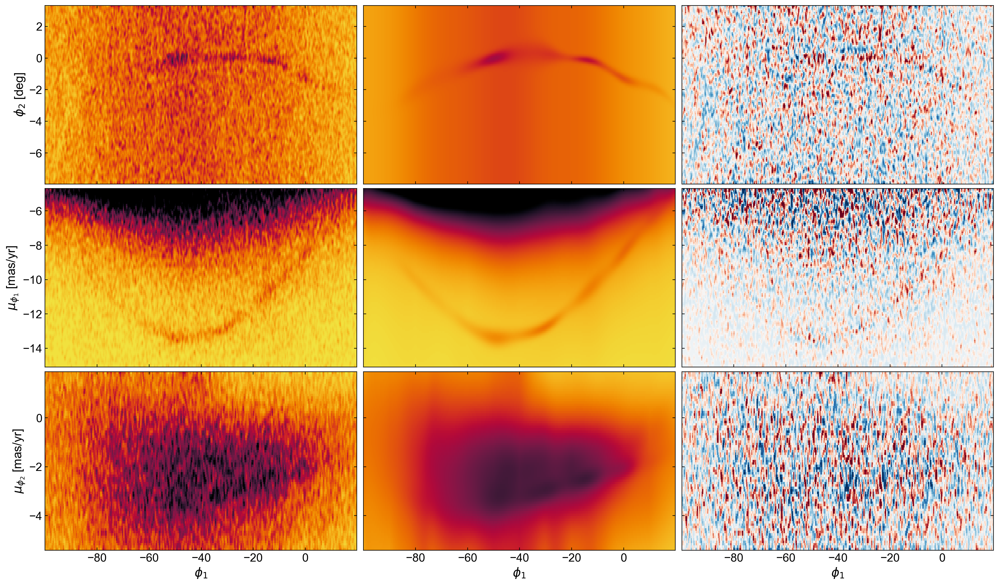

In [45]:
fig, axes = plt.subplots(
    len(stream_opt.coord_names) - 1,
    3, 
    figsize=(18, 3.5 * (len(stream_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=run_data,
    grids=Base.default_grids,
    axes=axes[:, 0],
    pcolormesh_kwargs=dict(rasterized=True, vmin=0, vmax=5)
)
mix_opt.plot_model_projections(axes=axes[:, 1], label=False,
                              pcolormesh_kwargs=dict(rasterized=True, vmin=0, vmax=5))
mix_opt.plot_residual_projections(
    data=run_data, axes=axes[:, 2], label=False,
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu')
)

for ax in axes[-1]:
    ax.set_xlabel(r"$\phi_1$")

In [46]:
with open('../data/mix_opt_params.pkl', 'wb') as output:
    pickle.dump(mix_opt_pars, output)

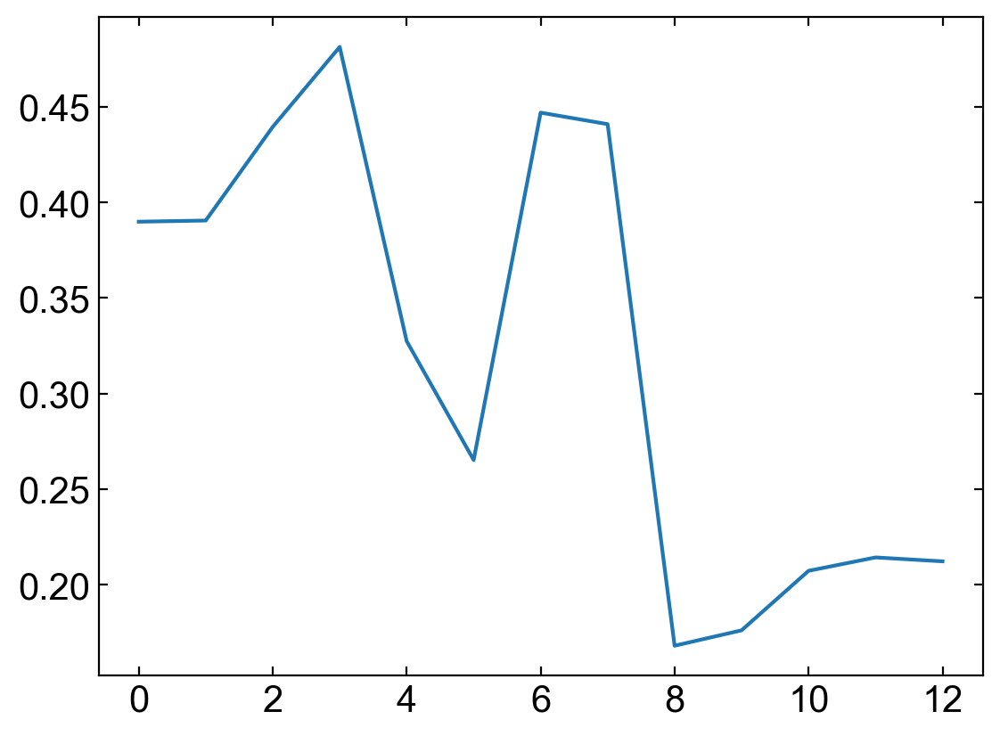

In [48]:
plt.plot(np.exp(mix_opt_pars['stream']['phi2']['ln_std']))
plt.show()

In [44]:
stream_comp, bkg_comp = mix_opt.components[0], mix_opt.components[1]
stream_ll = -np.log(stream_comp.get_N()) + stream_comp.ln_number_density(run_data)
bkg_ll = -np.log(bkg_comp.get_N()) + bkg_comp.ln_number_density(run_data)
print(stream_ll.sum(), bkg_ll.sum())

-inf -977767.6940153923


I think what I've done here is show that there is a typo in stream-membership. I think that in the ln-Likelihood function, it should be np.log(N) instead of just N (or the equivalent, since the syntax is slightly different in different functions).

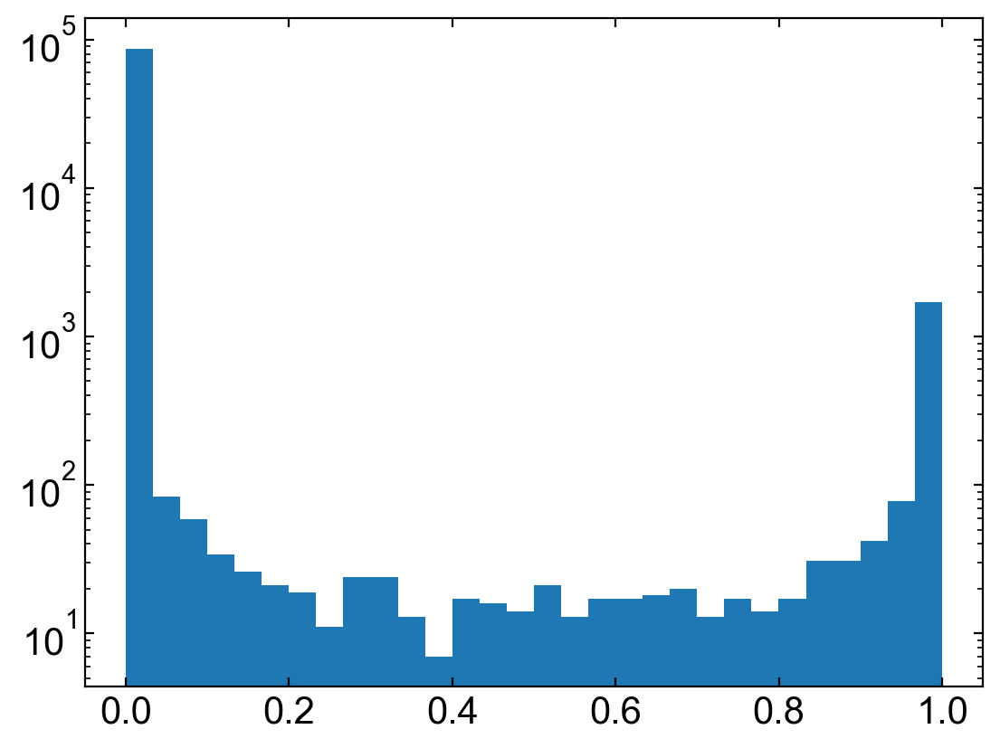

In [46]:
memb_prob = np.exp(stream_ll - np.logaddexp(stream_ll,bkg_ll))
plt.hist(memb_prob, bins=30)
plt.yscale('log')

In [47]:
(memb_prob > 0.5).sum()

2062

Text(0, 0.5, '$\\phi_2$')

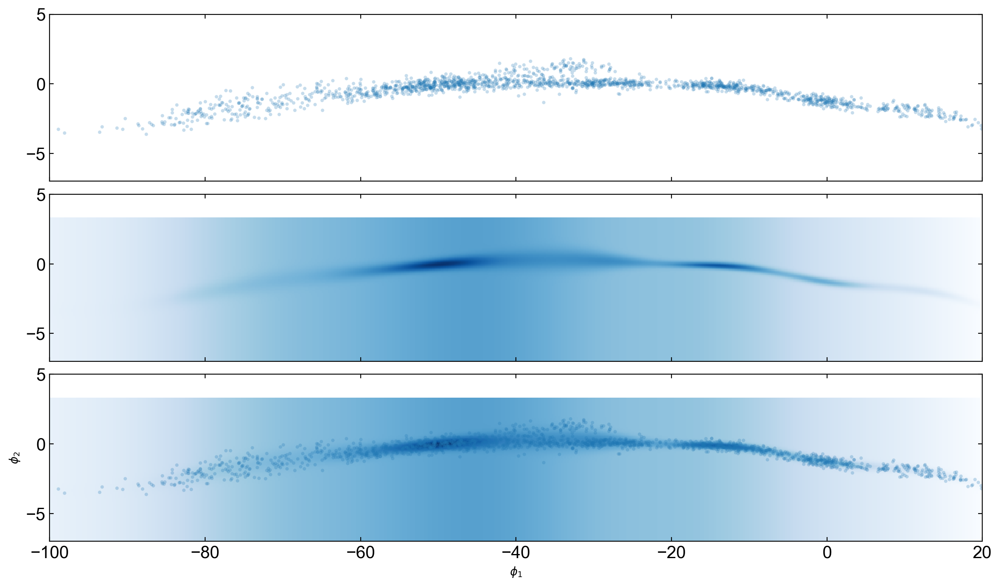

In [48]:
_grids, ln_dens = mix_opt.evaluate_on_2d_grids()

fig, axes = plt.subplots(3, 1, figsize=(12, 7), constrained_layout=True, sharex=True, sharey=True)
for ax in [axes[0], axes[2]]:
    ax.plot(
        run_data['phi1'][memb_prob>0.9],
        run_data['phi2'][memb_prob>0.9],
        marker="o",
        markeredgewidth=0,
        markersize=3.0,
        ls="none",
        alpha=0.25,
    )
    
for ax in [axes[1], axes[2]]:
    ax.pcolormesh(
        _grids[('phi1', 'phi2')][0],
        _grids[('phi1', 'phi2')][1],
        np.exp(ln_dens[('phi1', 'phi2')]),
        cmap="Blues",
        shading='auto'
    )
ax.set_xlim(-100, 20)
ax.set_ylim(-7, 5)

ax.set_xlabel(r"$\phi_1$")
ax.set_ylabel(r"$\phi_2$")

# Off-track

In [199]:
OffTrackModel.offtrack_update(p, cat, dens_steps=np.array([10,1]))

In [200]:
offtrack_init_p = {
    "ln_N": np.log(90),
    ("phi1", "phi2"): {
        "zs": np.zeros(OffTrackModel.phi12_locs.shape[0] - 1)
    },
    "pm1": stream_opt_pars["pm1"].copy(),
    "pm2": stream_opt_pars["pm2"].copy()
}

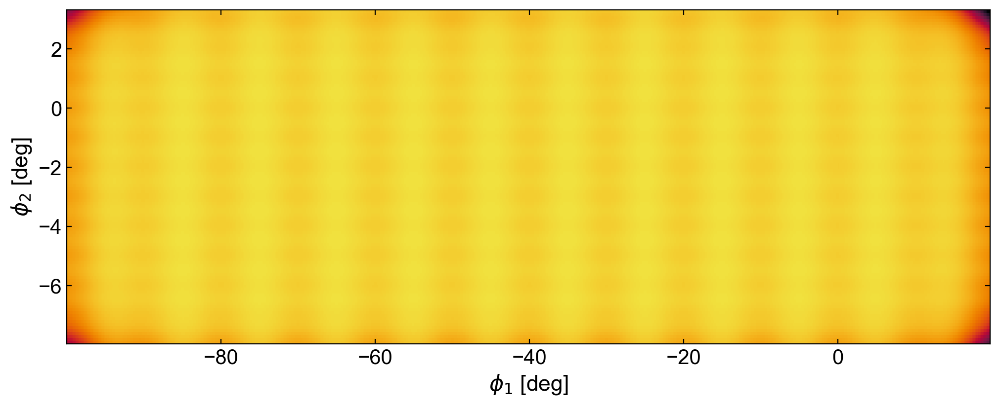

In [201]:
offtrack_model0 = OffTrackModel(offtrack_init_p)
_ = offtrack_model0.plot_model_projections(grid_coord_names=[('phi1', 'phi2')])

In [203]:
offtrack_model0.phi12_locs.shape

(183, 2)

# Mixture of all components

In [204]:
full_Components = [StreamDensModel, BackgroundModel, OffTrackModel]
full_mix_params0 = {
    "stream": mix_opt_pars['stream'],
    "background": mix_opt_pars['background'],
    "offtrack": offtrack_init_p,
}

In [205]:
tied_params = [
    (("offtrack", "pm1"), ("stream", "pm1")),
    (("offtrack", "pm2"), ("stream", "pm2")),
]
full_mix_init = StreamMixtureModel(
    full_mix_params0, full_Components, tied_params=tied_params
)

In [206]:
full_mix_opt_pars, info = StreamMixtureModel.optimize(
    data=run_data,
    Components=full_Components,
    #tied_params=tied_params,
    init_params=full_mix_params0,
    use_bounds=True,
)

# full_mix_opt_pars, info = optimize_mixture(StreamMixtureModel, data=run_data,
#                                       init_params=full_mix_params0, Components=full_Components,
#                                       use_bounds=True)

full_mix_opt = StreamMixtureModel(full_mix_opt_pars, Components=full_Components)
info

ScipyMinimizeInfo(fun_val=Array(0.48265567, dtype=float64, weak_type=True), success=True, status=0, iter_num=3987, hess_inv=LbfgsInvHessProduct(sk=[[ 3.14378700e-05  7.31545589e-06  1.61216038e-05 ... -1.15607122e-05
  -1.85853430e-05 -3.09456731e-06]
 [ 3.17876914e-05 -7.16521726e-07  1.40542602e-05 ... -1.79620619e-05
  -1.13447919e-05 -1.12784778e-05]
 [-1.21525446e-05  1.09414403e-05  4.07474191e-05 ... -1.30865503e-05
  -2.83303668e-05 -1.05058126e-05]
 ...
 [-2.41351626e-05  1.05638660e-05  1.30534685e-05 ... -2.41142903e-05
  -2.67264838e-05 -3.41538809e-06]
 [ 1.21382479e-05  9.99291505e-06  1.43626859e-05 ... -2.57289223e-05
  -2.84577851e-05 -4.90620665e-06]
 [-8.01523824e-05  2.31113157e-07  9.87055504e-06 ... -2.22213555e-05
  -1.25962148e-05 -9.77722355e-06]], yk=[[ 3.06669407e-05  3.63387384e-08  3.08167510e-07 ... -1.41709817e-08
  -2.37364257e-08  1.64291598e-10]
 [ 3.09359704e-05  2.43485182e-08  1.87223852e-07 ... -4.02614232e-08
  -2.08284917e-08  4.24973757e-10]
 [-

In [165]:
import pickle

In [166]:
with open('../data/full_model_opt_params.pkl', 'wb') as output_file2:
    pickle.dump(full_mix_opt_pars, output_file2)

NameError: name 'full_mix_opt_pars' is not defined

In [172]:
# with open('../data/full_model_optimization.pkl', 'rb') as input_file:
#     testing1 = pickle.load(input_file)

with open('../data/full_model_opt_params_small_sep.pkl', 'rb') as input_file:
    full_mix_opt_pars = pickle.load(input_file)

In [47]:
# if optimization fails, run again with initialization from the end of the last run

# full_mix_params1 = full_mix_opt_pars

# full_mix_opt_pars1, info1 = StreamMixtureModel.optimize(
#     data=run_data,
#     Components=full_Components,
#     #tied_params=tied_params,
#     init_params=full_mix_params1,
#     use_bounds=True,
# )
# full_mix_opt1 = StreamMixtureModel(full_mix_opt_pars1, Components=full_Components)
# info1

In [174]:
import copy
tmp_pars = copy.deepcopy(full_mix_opt_pars['offtrack'])
tmp_pars['pm1'] = full_mix_opt_pars['stream']['pm1'].copy()
tmp_pars['pm2'] = full_mix_opt_pars['stream']['pm2'].copy()
tmp = OffTrackModel(tmp_pars)
tmp.plot_model_projections(
    grid_coord_names=[("phi1", "phi2")], label=False, 
    pcolormesh_kwargs=dict(vmin=0, vmax=1, cmap='cmr.ember_r')
)

ValueError: No default grid for phi1, so you must specify it via the `grids` argument

(<Figure size 1000x400 with 1 Axes>,
 array([<Axes: xlabel='$\\phi_1$', ylabel='$\\phi_2$'>], dtype=object))

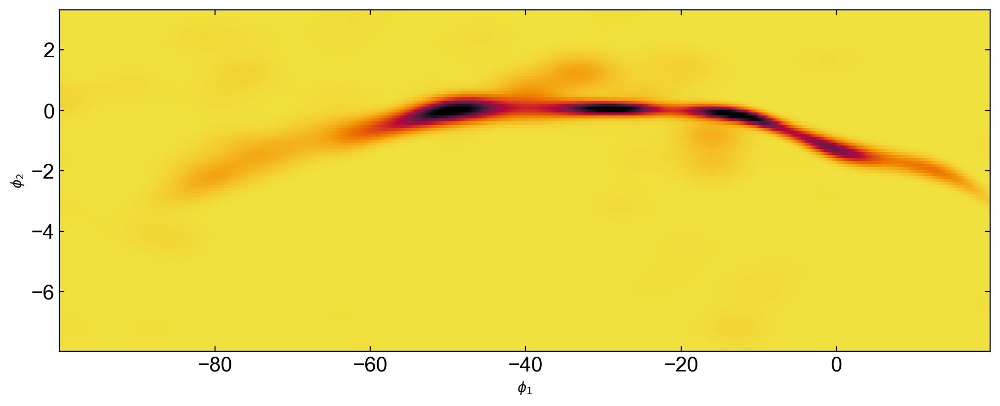

In [76]:
full_mix_nobkg_opt = StreamMixtureModel(
    full_mix_opt_pars, Components=[StreamDensModel, OffTrackModel], tied_params=tied_params
)
full_mix_nobkg_opt.plot_model_projections(
    grid_coord_names=[("phi1", "phi2")], pcolormesh_kwargs=dict(vmin=0, vmax=1, cmap='cmr.ember_r')
)

In [52]:
full_mix_opt.components

In [62]:
stream_comp, bkg_comp, offtrack_comp = full_mix_opt.components[0], full_mix_opt.components[1], full_mix_opt.components[2]
stream_ll = -np.log(stream_comp.get_N()) + stream_comp.ln_number_density(run_data)
bkg_ll = -np.log(bkg_comp.get_N()) + bkg_comp.ln_number_density(run_data)
offtrack_ll = -np.log(offtrack_comp.get_N()) + offtrack_comp.ln_number_density(run_data)

#one way
fg_ll = np.logaddexp(stream_ll, offtrack_ll)

#another way
# fg_comps = full_mix_nobkg_opt.components
# fg_ll_ = -np.log(fg_comps[0].get_N() + fg_comps[1].get_N()) + full_mix_nobkg_opt.ln_number_density(run_data)

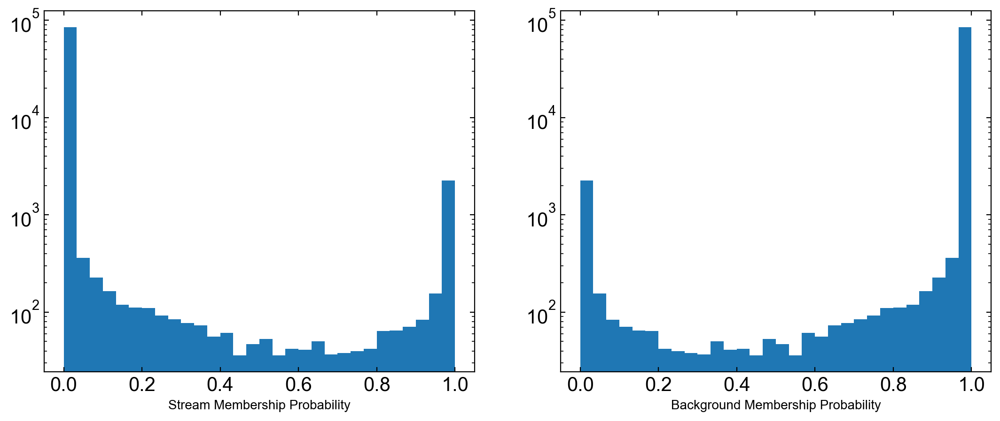

In [63]:
final_memb_prob = np.exp(fg_ll - np.logaddexp(fg_ll,bkg_ll)) #update for offtrack included
bkg_prob = np.exp(bkg_ll - np.logaddexp(fg_ll,bkg_ll))

fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(13, 5))
ax1.hist(final_memb_prob, bins=30)
ax1.set_yscale('log')
ax1.set_xlabel('Stream Membership Probability')

ax2.hist(bkg_prob, bins=30)
ax2.set_xlabel('Background Membership Probability')
ax2.set_yscale('log')
plt.show()

In [78]:
(final_memb_prob > 0.99).sum()

1951

In [66]:
# for the plotting, but takes a minute, so have it in a differnet cell
_grids, ln_dens = full_mix_opt.evaluate_on_2d_grids()

KeyError: 'phi1'

Text(0, 0.5, '$\\phi_2$')

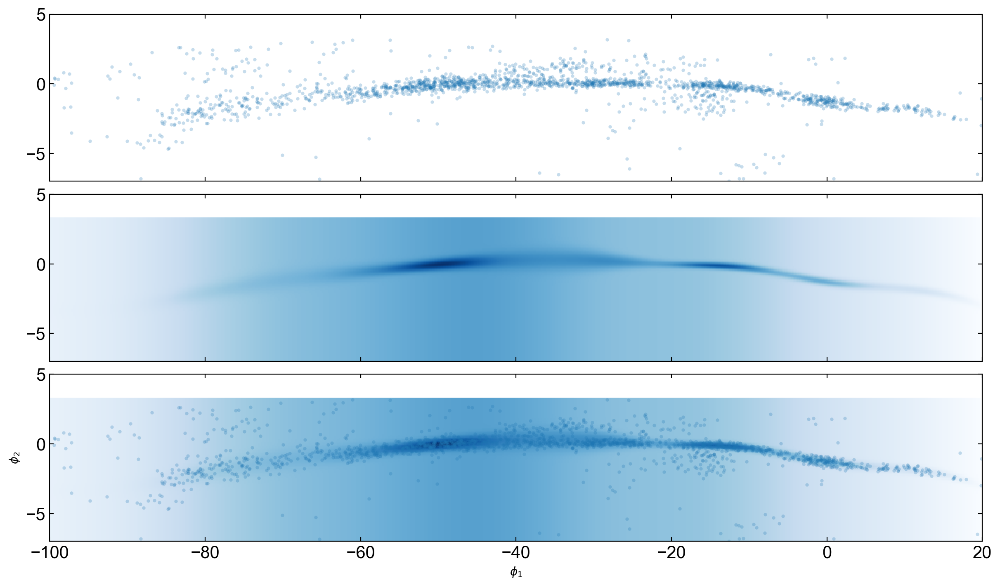

In [77]:
threshold = (final_memb_prob>0.99)

fig, axes = plt.subplots(3, 1, figsize=(12, 7), constrained_layout=True, sharex=True, sharey=True)
for ax in [axes[0], axes[2]]:
    ax.plot(
        run_data['phi1'][threshold],
        run_data['phi2'][threshold],
        marker="o",
        markeredgewidth=0,
        markersize=3.0,
        ls="none",
        alpha=0.25,
    )
    
for ax in [axes[1], axes[2]]:
    ax.pcolormesh(
        _grids[('phi1', 'phi2')][0],
        _grids[('phi1', 'phi2')][1],
        np.exp(ln_dens[('phi1', 'phi2')]),
        cmap="Blues",
        shading='auto'
    )
ax.set_xlim(-100, 20)
ax.set_ylim(-7, 5)

ax.set_xlabel(r"$\phi_1$")
ax.set_ylabel(r"$\phi_2$")

KeyError: 'phi1'

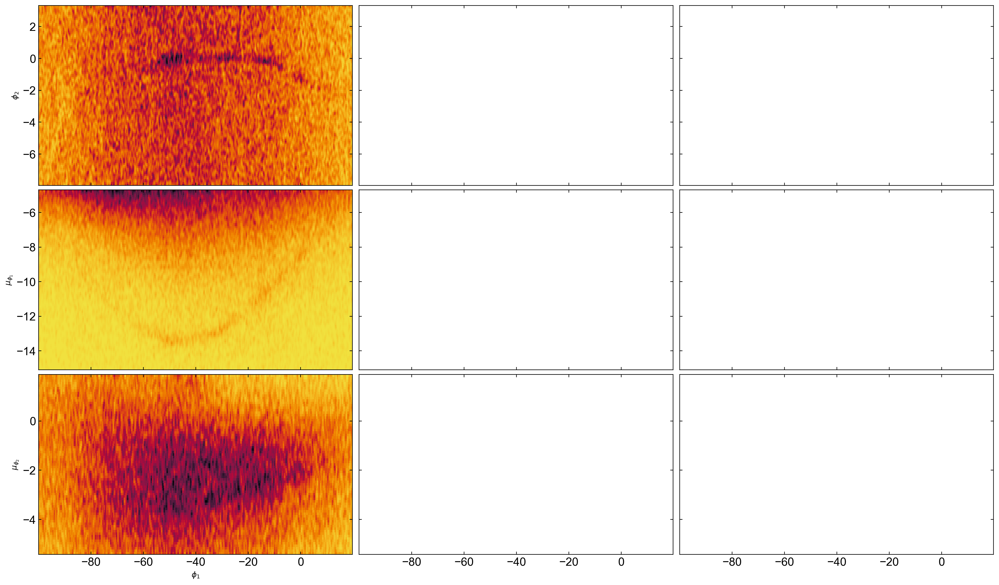

In [79]:
fig, axes = plt.subplots(
    len(full_mix_nobkg_opt.coord_names) - 1,
    3, 
    figsize=(18, 3.5 * (len(full_mix_nobkg_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=run_data,
    grids=Base.default_grids,
    axes=axes[:, 0],
)
full_mix_nobkg_opt.plot_model_projections(axes=axes[:, 1])
full_mix_nobkg_opt.plot_residual_projections(
    data=run_data, axes=axes[:, 2], pcolormesh_kwargs=dict(vmin=-1, vmax=1)
)

for ax in axes[-1]:
    ax.set_xlabel(r"$\phi_1$")

KeyError: 'phi1'

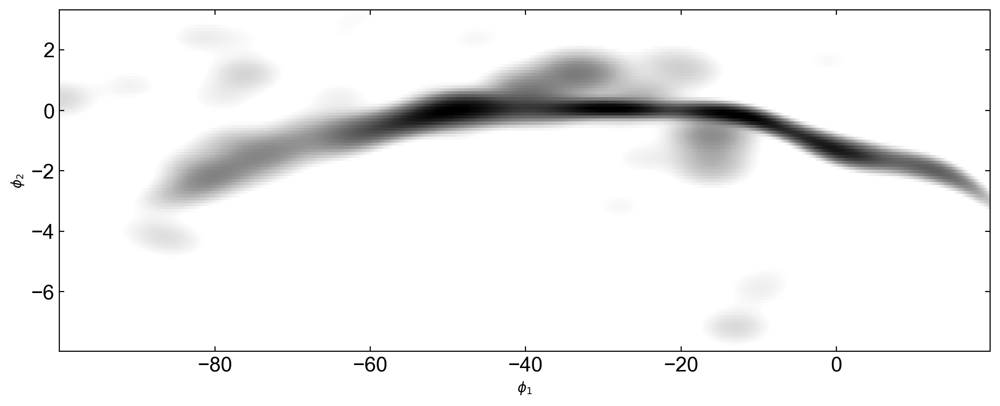

In [81]:
full_mix_nobkg_opt = StreamMixtureModel(
    full_mix_opt_pars, Components=[StreamDensModel, OffTrackModel], tied_params=tied_params
)
full_mix_nobkg_opt.plot_model_projections(
    grid_coord_names=[("phi1", "phi2")], pcolormesh_kwargs=dict(norm=mpl.colors.LogNorm(vmin=1e-2, vmax=1), cmap='Greys')
)

full_mix_nobkg_opt.plot_model_projections(
    grid_coord_names=[("phi1", "pm1")], pcolormesh_kwargs=dict(norm=mpl.colors.LogNorm(vmin=1e-2, vmax=1), cmap='Greys')
)

full_mix_nobkg_opt.plot_model_projections(
    grid_coord_names=[("phi1", "pm2")], pcolormesh_kwargs=dict(norm=mpl.colors.LogNorm(vmin=1e-2, vmax=1), cmap='Greys')
)

In [82]:
full_mix_opt.spar_steps

AttributeError: 'StreamMixtureModel' object has no attribute 'spar_steps'

KeyError: 'phi1'

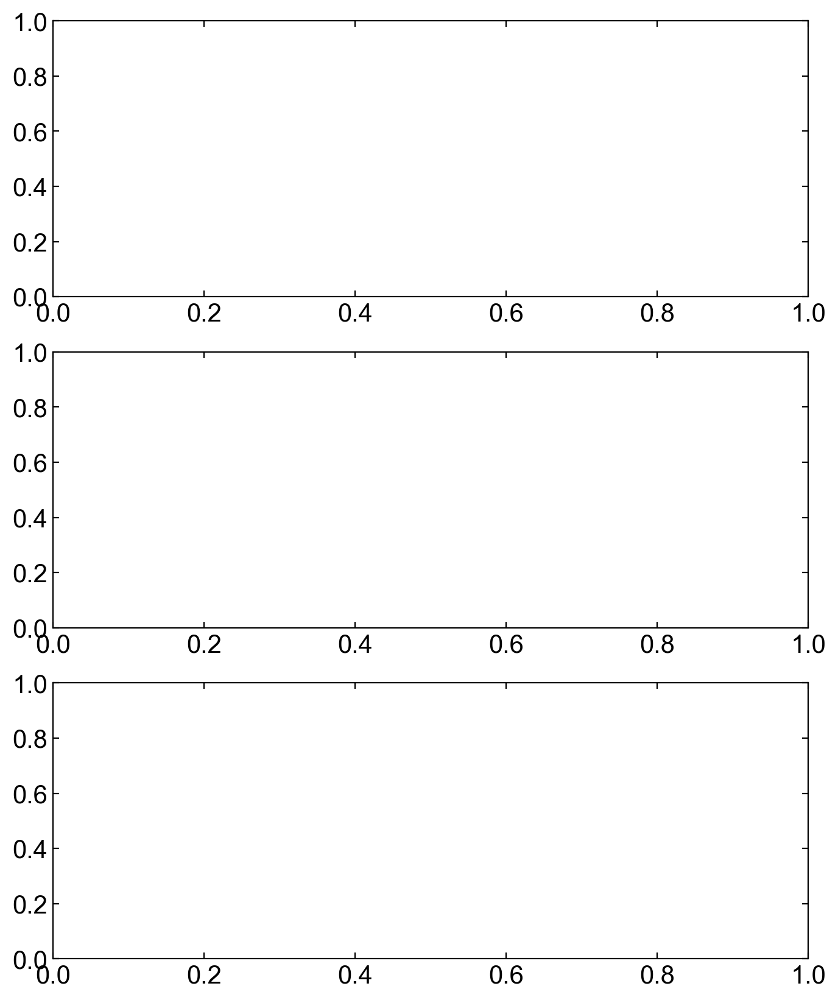

In [102]:
fig, axs = plt.subplots(3,1,figsize=(8,10))
full_mix_nobkg_opt.plot_model_projections(pcolormesh_kwargs=dict(vmin=0, vmax=0.5), axes=axs)

KeyError: 'phi1'

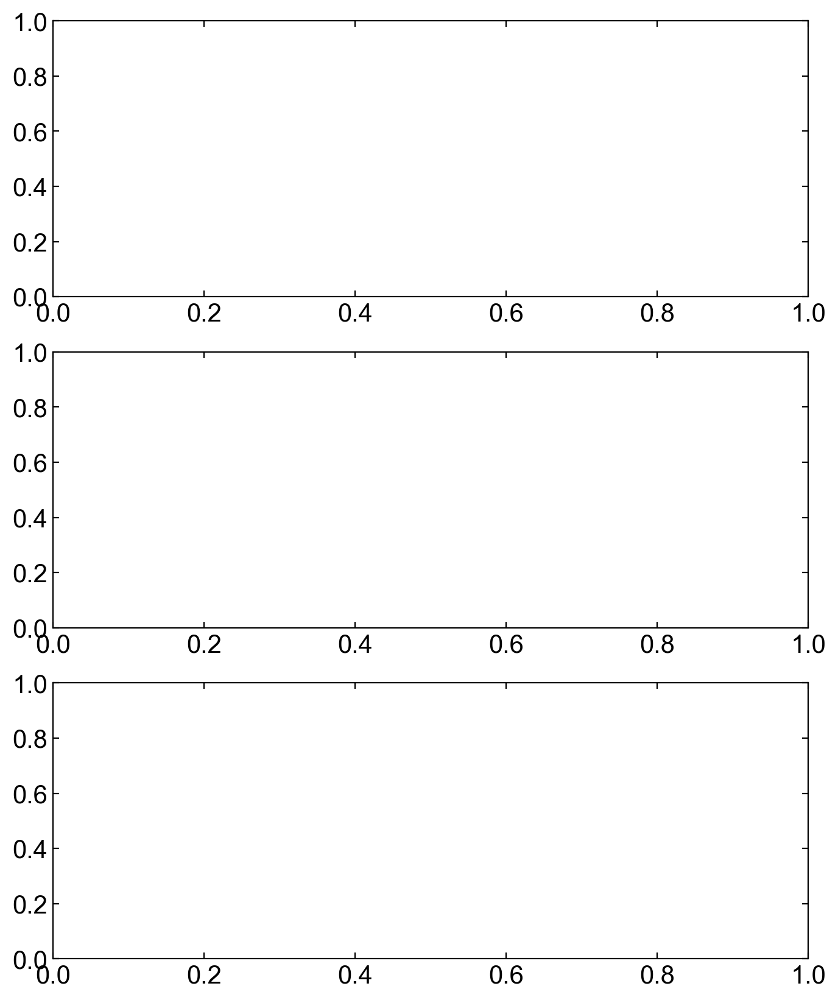

In [96]:
fig, axs = plt.subplots(3,1,figsize=(8,10))
full_mix_opt.plot_model_projections(pcolormesh_kwargs=dict(vmin=0, vmax=0.5), axes=axs)

TODO: how to plot projections for components where the x coord is in a joint, like OffTrack?

KeyError: 'phi1'

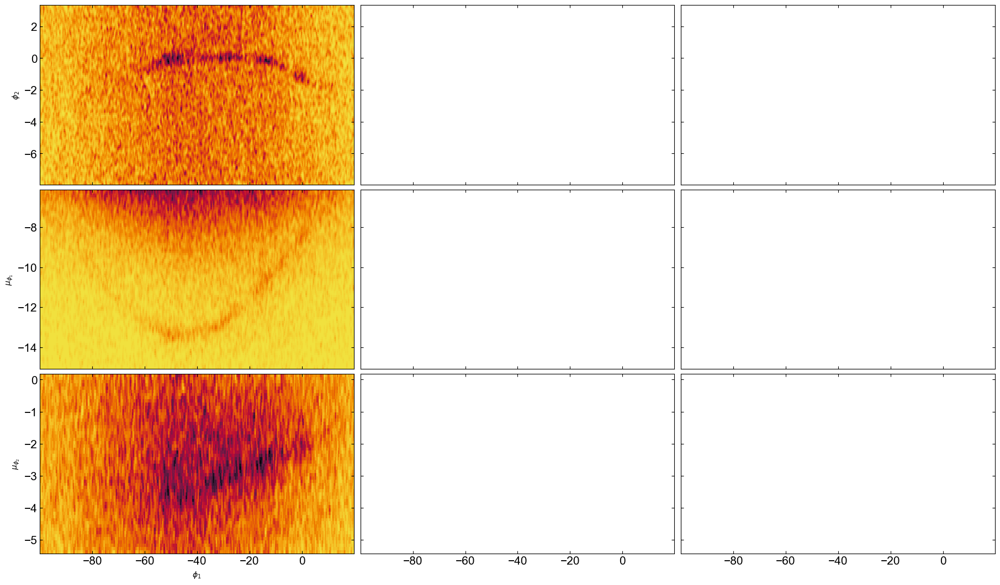

In [81]:
fig, axes = plt.subplots(
    len(stream_opt.coord_names) - 1,
    3, 
    figsize=(18, 3.5 * (len(stream_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)


axes = np.atleast_2d(axes)
plot_data_projections(
    data=run_data,
    grids=Base.default_grids,
    axes=axes[:, 0],
)
full_mix_opt1.plot_model_projections(axes=axes[:, 1])
full_mix_opt1.plot_residual_projections(
    data=run_data, axes=axes[:, 2], pcolormesh_kwargs=dict(vmin=-1, vmax=1)
)

for ax in axes[-1]:
    ax.set_xlabel(r"$\phi_1$")